In [64]:
# Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
import cv23_lab1_part2_utils as utils
import cv23_lab1_part3_utils as utils3

%matplotlib inline

SYNTHETIC IMAGE READ - NOISE ADDITION 

Resolution:  (512, 512)
Range: 0 - 255 


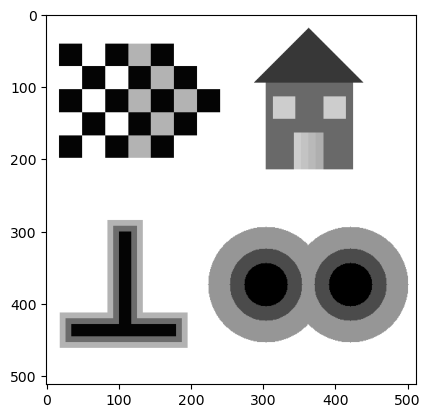

In [65]:
# Read grayscale image
img = cv2.imread('edgetest_23.png', cv2.IMREAD_GRAYSCALE)

print("Resolution: ", img.shape)
print("Range: %d - %d " % (img.min(), img.max()))
# Normalize to [0,1]
img = img.astype(float)/255
# Show image
plt.imshow(img, cmap='gray')

In [66]:
import math
sigma1 = (img.max() - img.min()) / 10
sigma2 = sigma1 * math.sqrt(10)
n1 = np.random.normal(loc = 0, scale =  sigma1, size =(img.shape[0], img.shape[1]))
n2 = np.random.normal(loc = 0, scale =  sigma2, size =(img.shape[0], img.shape[1]))
n1.shape

(512, 512)

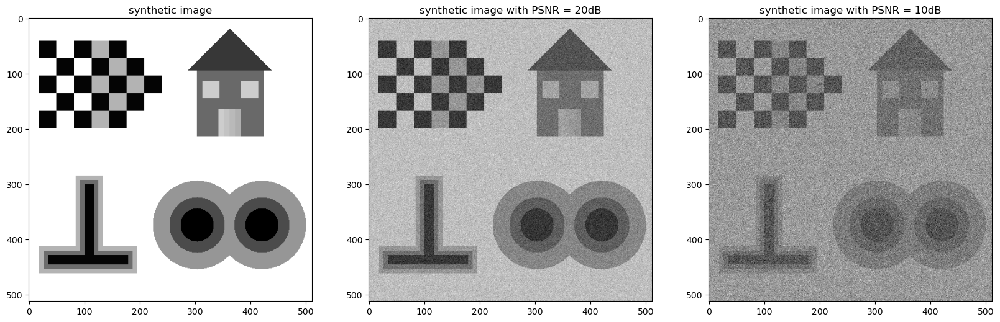

In [67]:
img1 = img + n1
img2 = img + n2
plt.figure(figsize=(20,10))
plt.subplot(1, 3, 1)
plt.title('synthetic image')
plt.imshow(img, cmap='gray') 
# Show image
plt.subplot(1, 3, 2)
plt.title('synthetic image with PSNR = 20dB')
plt.imshow(img1, cmap='gray')


# Show image
plt.subplot(1, 3, 3)
plt.title('synthetic image with PSNR = 10dB')
plt.imshow(img2, cmap='gray')
plt.savefig('synthetic.jpg')



GAUSSIAN - LOG FILTERS

In [68]:
def filters(sigma):
    n = int(2*np.ceil(3*sigma)+1)
    gauss1D = cv2.getGaussianKernel(n, sigma) # Column vector
    gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel
    log_app = cv2.Laplacian(gauss2D, -1)
    x = y = np.linspace(-round(n/2),round(n/2),n) # floor
    X, Y = np.meshgrid(x, y)
    r2 = (X**2 + Y**2)/(sigma**2)
    log = np.exp(-r2/2)*(r2 - 2)/(2*np.pi*(sigma**4))
    return gauss2D, log_app, log

In [69]:
print(np.sum((filters(2)[1]-filters(2)[2])**2)/169)


2.9195076792379816e-07


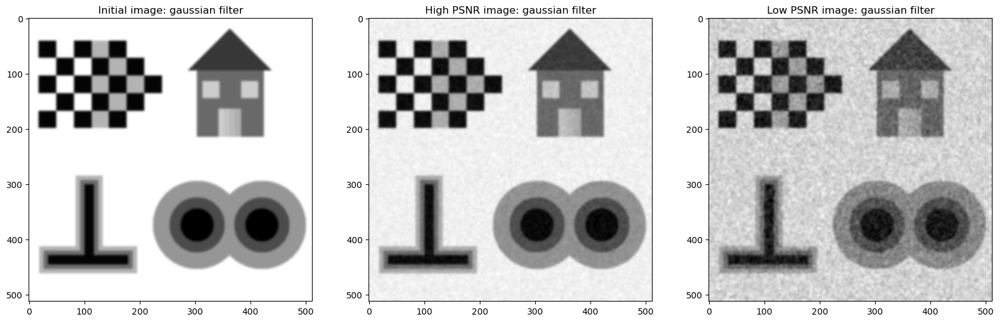

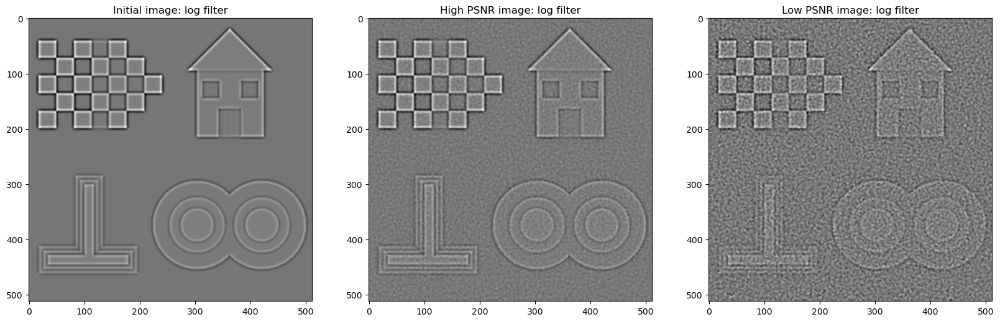

In [70]:
img_g = cv2.filter2D(img, -1, filters(2)[0])
plt.figure(figsize=(20,10))
plt.subplot(1, 3, 1)
plt.title("Initial image: gaussian filter")
plt.imshow(img_g, cmap='gray') # gray_r colormap shows 1 as black

img1_g = cv2.filter2D(img1, -1, filters(2)[0])
plt.subplot(1, 3, 2)
plt.title("High PSNR image: gaussian filter")
plt.imshow(img1_g, cmap='gray') # gray_r colormap shows 1 as black

img2_g = cv2.filter2D(img2, -1, filters(2)[0])
plt.subplot(1, 3, 3)
plt.title("Low PSNR image: gaussian filter")
plt.imshow(img2_g, cmap='gray') # gray_r colormap shows 1 as black

img_log = cv2.filter2D(img, -1, filters(2)[2])
plt.figure(figsize=(20,10))
plt.subplot(1, 3, 1)
plt.title("Initial image: log filter")
plt.imshow(img_log, cmap='gray') # gray_r colormap shows 1 as black

img1_log = cv2.filter2D(img1, -1, filters(2)[2])
plt.subplot(1, 3, 2)
plt.title("High PSNR image: log filter")
plt.imshow(img1_log, cmap='gray') # gray_r colormap shows 1 as black

img2_log = cv2.filter2D(img2, -1, filters(2)[2])
plt.subplot(1, 3, 3)
plt.title("Low PSNR image: log filter")
plt.imshow(img2_log, cmap='gray') # gray_r colormap shows 1 as black

EDGE DETECTION 

In [71]:
def EdgeDetect(img, sigma, thres, linear = True):
    kern = np.array([
                            [0,1,0],
                            [1,1,1],
                            [0,1,0]
                        ], dtype=np.uint8)
    gauss2D, log_app, log = filters(sigma)
    if linear:
        img_f = cv2.filter2D(img, -1, log) #log_app
    else:
        img_f = cv2.filter2D(img, -1, gauss2D)
        img_f = cv2.dilate(img_f, kern) + cv2.erode(img_f, kern) - 2 * img_f
    _, img_b = cv2.threshold(img_f, 0.0, 1, cv2.THRESH_BINARY)
    img_b = cv2.dilate(img_b, kern) - cv2.erode(img_b, kern)
    grad = np.array(np.gradient(cv2.filter2D(img, -1, gauss2D)))
    thres = thres * np.max(grad)
    return np.logical_and(img_b==1, (grad[0]**2 + grad[1]**2) >= thres**2)
    

    #print(np.unique(img_b))


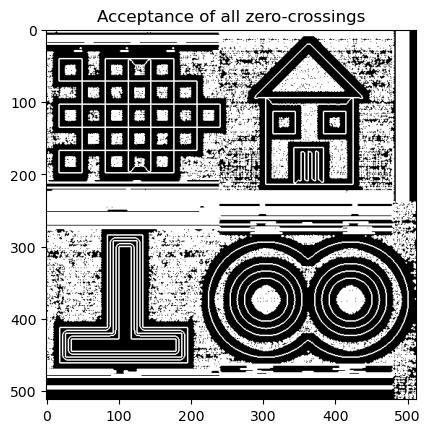

In [72]:
b1 = EdgeDetect(img, 2.4, 0, linear=False)
plt.figure()
plt.title('Acceptance of all zero-crossings')
plt.imshow(b1, cmap='gray') # gray_r colormap shows 1 as black

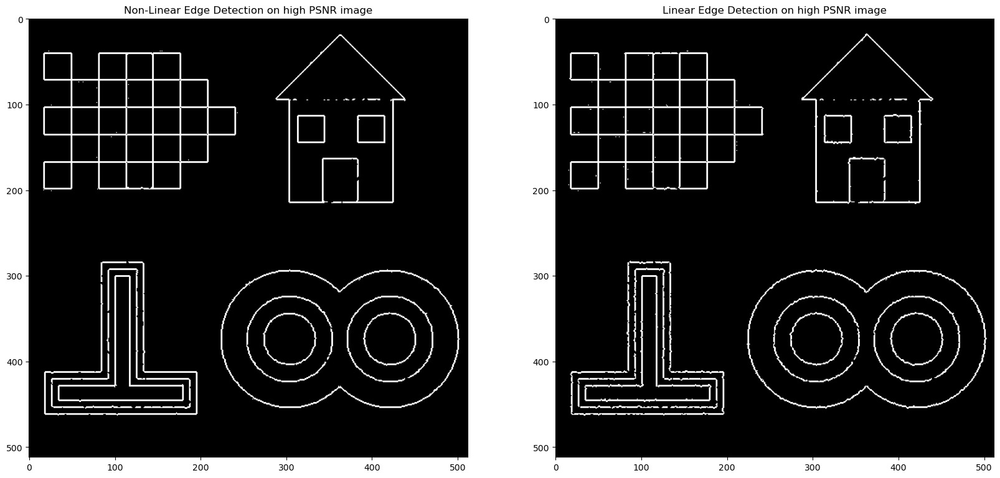

In [73]:
edge1N = EdgeDetect(img1, 1.3, 0.2, linear=False) #1.3 0.2 9650 2.1 0.21 9647
edge1L = EdgeDetect(img1, 1.3, 0.2, linear=True)
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.title('Non-Linear Edge Detection on high PSNR image')
plt.imshow(edge1N, cmap='gray') # gray_r colormap shows 1 as black
plt.subplot(1, 2, 2)
plt.title('Linear Edge Detection on high PSNR image')
plt.imshow(edge1L, cmap='gray') # gray_r colormap shows 1 as black

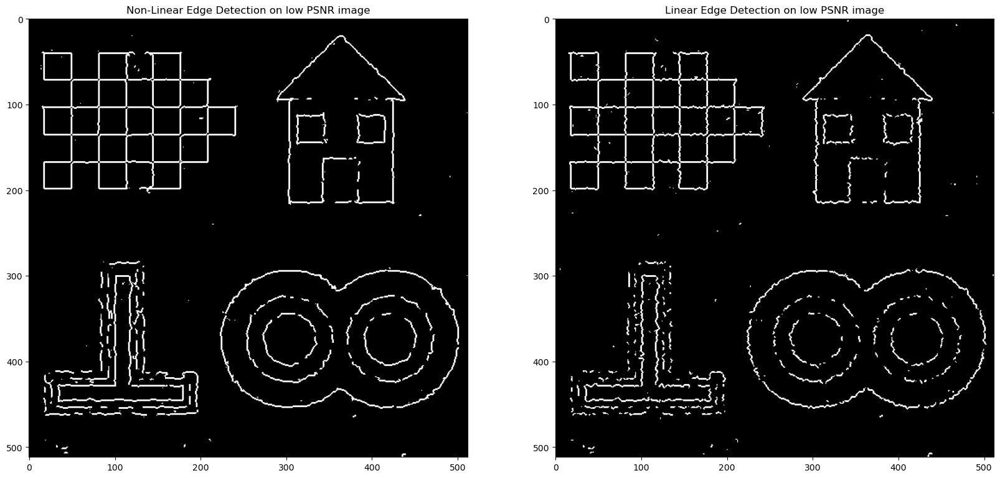

In [74]:
edge2N = EdgeDetect(img2, 2.4, 0.24, linear=False) #2.4 0.23 0.7686
edge2L = EdgeDetect(img2, 2, 0.26, linear=True) #2 0.26 0.6943
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.title('Non-Linear Edge Detection on low PSNR image')
plt.imshow(edge2N, cmap='gray') # gray_r colormap shows 1 as black
plt.subplot(1, 2, 2)
plt.title('Linear Edge Detection on low PSNR image')
plt.imshow(edge2L, cmap='gray') # gray_r colormap shows 1 as black



EVALUATION OF EDGE-DETECTION

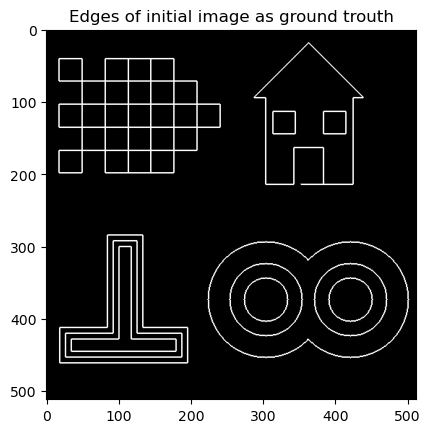

In [75]:
kern = np.array([ [0,1,0],
                  [1,1,1],
                  [0,1,0]
                ], dtype=np.uint8)
th_re = 0.2
ground_trouth = cv2.dilate(img, kern) - cv2.erode(img, kern)
_, ground_trouth = cv2.threshold(ground_trouth, th_re, 1, cv2.THRESH_BINARY)
plt.figure()
plt.title('Edges of initial image as ground trouth')
plt.imshow(ground_trouth, cmap='gray') # gray_r colormap shows 1 as black


In [76]:
def cred(img, ground_trouth):
    intersection = np.sum(img + ground_trouth == 2)
    I = np.sum(img)
    GT = np.sum(ground_trouth)
    return intersection*(1/I + 1/GT) / 2

In [77]:
print(cred(edge1N, ground_trouth), cred(edge1L, ground_trouth))
print(cred(edge2N, ground_trouth), cred(edge2L, ground_trouth))

0.968275610621545 0.94584747984752
0.776739603608225 0.6927610029968384


APPLICATION TO REAL IMAGES

<Figure size 640x480 with 0 Axes>

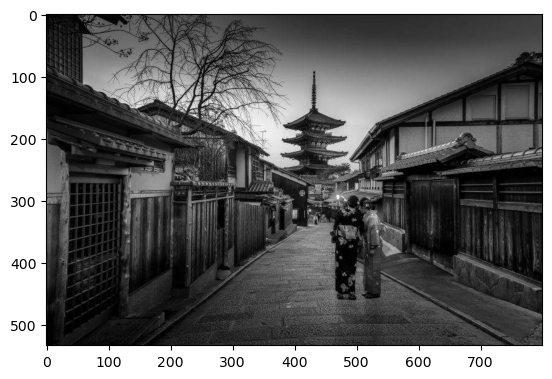

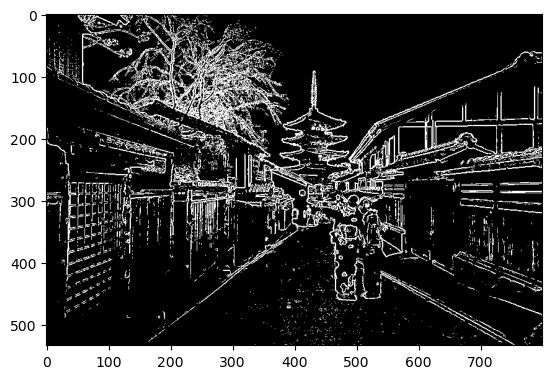

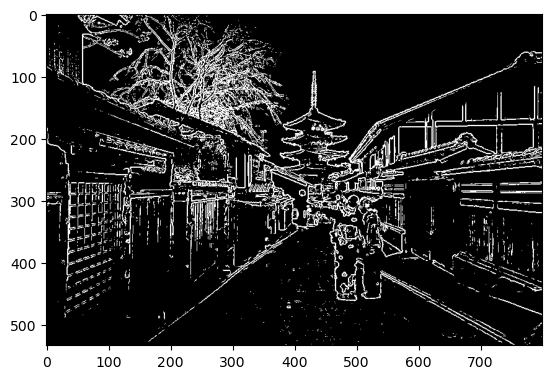

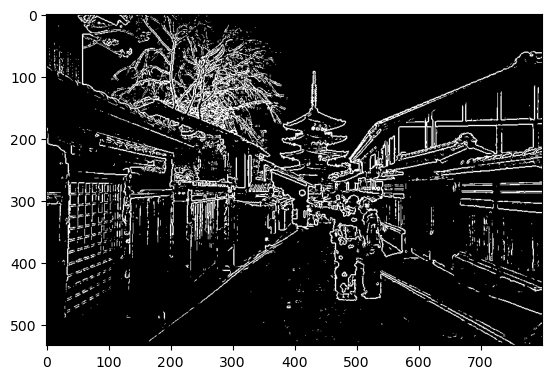

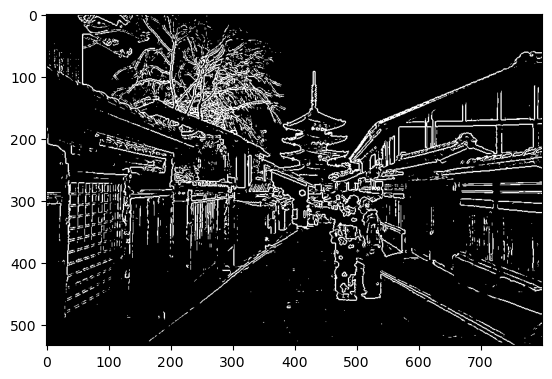

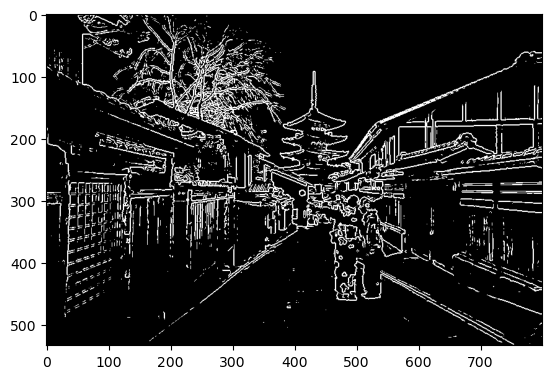

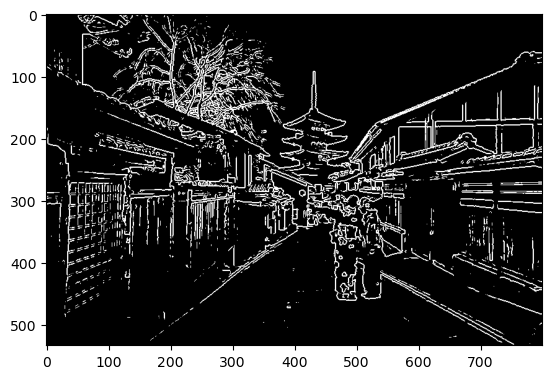

<Figure size 640x480 with 0 Axes>

In [78]:
kyoto = cv2.imread('kyoto_edges.jpg', cv2.IMREAD_GRAYSCALE)

kyoto = kyoto.astype(float)/255
# Show image
plt.imshow(kyoto, cmap='gray')

for i in [0.6, 0.7, 0.8, 0.9, 1, 1.1]:
    ky1 = EdgeDetect(kyoto, i, 0.22, linear=False)
    plt.figure()
    plt.imshow(ky1, cmap='gray') # gray_r colormap shows 1 as black
plt.figure()


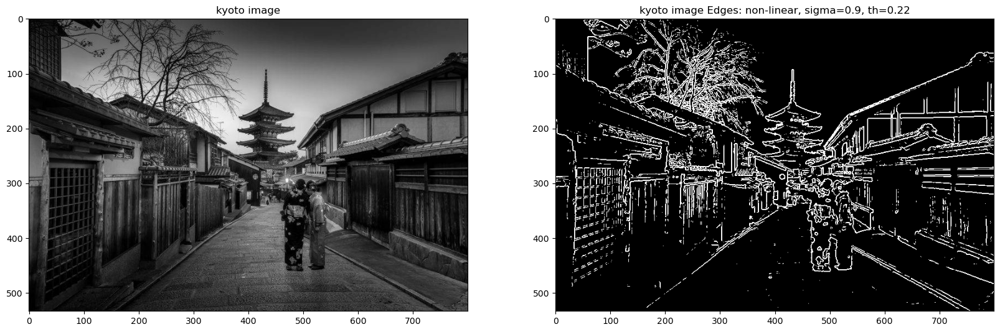

In [79]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.title('kyoto image')
plt.imshow(kyoto, cmap='gray')

plt.subplot(1,2,2)
plt.title('kyoto image Edges: non-linear, sigma=0.9, th=0.22')
plt.imshow(EdgeDetect(kyoto, 0.9, 0.22, linear=False), cmap='gray')


CORNER DETECTION

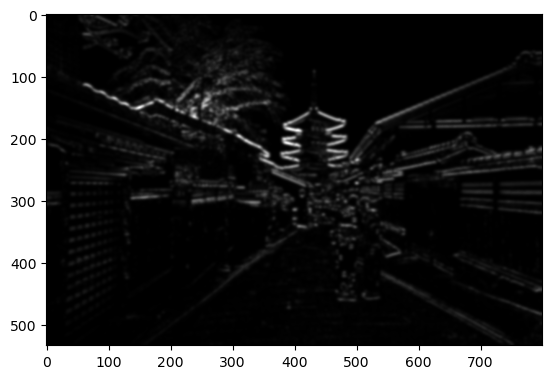

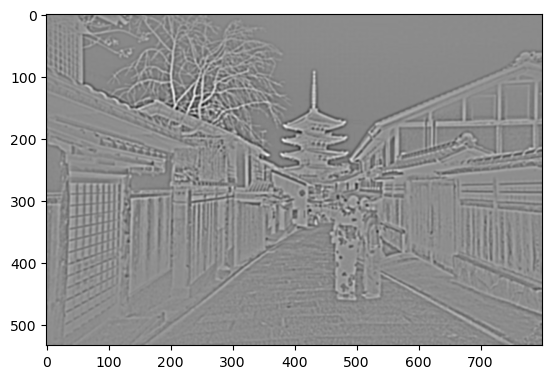

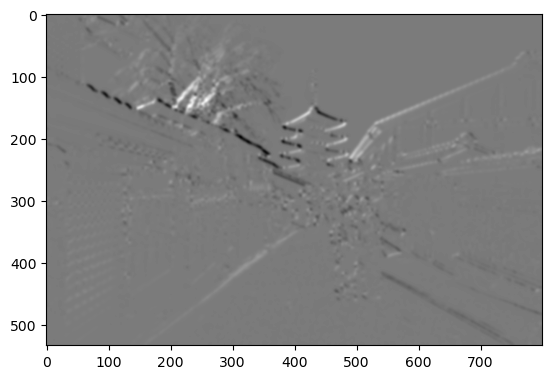

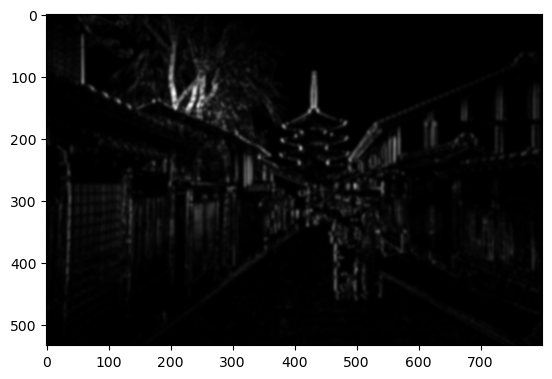

In [80]:
sigma = 1
r = 2
img_f = cv2.filter2D(kyoto, -1, filters(sigma)[0]) 
grad = np.array(np.gradient(img_f))
J1 = cv2.filter2D(grad[0] ** 2 , -1, filters(r)[0]) 
plt.figure()
plt.imshow(J1, cmap = 'gray')

log = cv2.filter2D(kyoto , -1, filters(r)[2]) 
plt.figure()
plt.imshow(log, cmap = 'gray')

J2 = cv2.filter2D(grad[1] * grad[0] , -1, filters(r)[0]) 
plt.figure()
plt.imshow(J2, cmap = 'gray')

J3 = cv2.filter2D(grad[1] ** 2 , -1, filters(r)[0]) 
plt.figure()
plt.imshow(J3, cmap = 'gray')


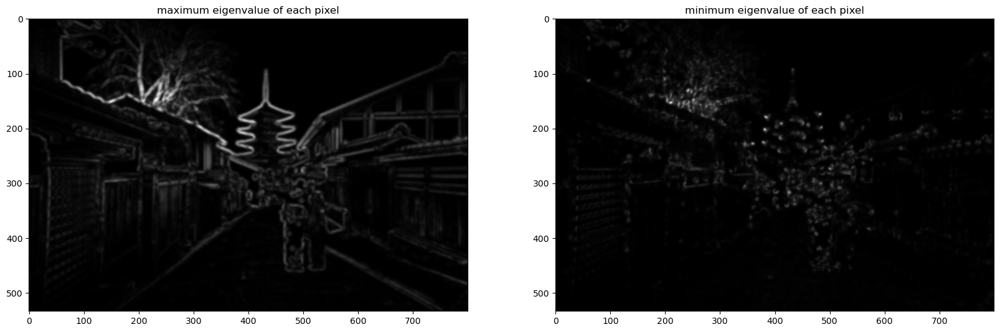

In [81]:
root = np.sqrt((J1 - J3)**2 + 4 * (J2**2))
lmax = 0.5 * (J1 + J3 + root)
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.title('maximum eigenvalue of each pixel')
plt.imshow(lmax, cmap = 'gray')

lmin = 0.5 * (J1 + J3 - root)
plt.subplot(1, 2, 2)
plt.title('minimum eigenvalue of each pixel')
plt.imshow(lmin, cmap = 'gray')

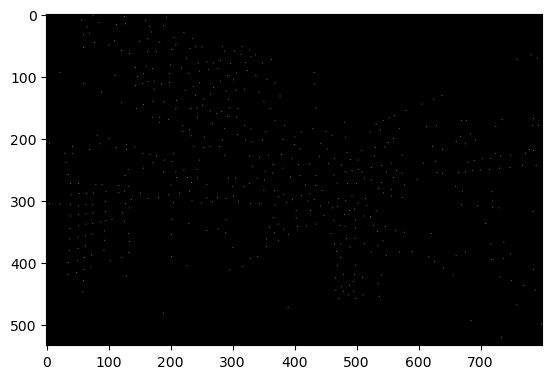

In [82]:
k = 0.01
R = lmin * lmax - k * ((lmax + lmin)**2)
ns = np.ceil(3*sigma)*2+1
B_sq = utils.disk_strel(ns)
Cond1 = ( R==cv2.dilate(R,B_sq) )
plt.figure()
n = np.logical_and(R > 0.003 * R.max(), Cond1)
plt.imshow(n, cmap = 'gray')
#plt.figure()
#plt.imshow(cv2.dilate(cv2.cornerHarris(np.float32(kyoto), 2, 3, 0.001), None), cmap = 'gray')

<AxesSubplot:>

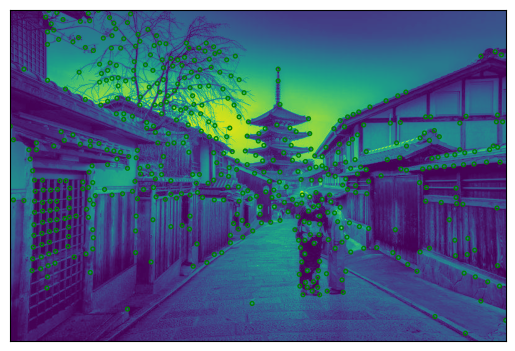

In [83]:
a = np.transpose(n.nonzero())
a[:, [1, 0]]= a[:,[0, 1]]
b = sigma * np.ones((len(a), 1))
b = np.hstack((a, b))
utils.interest_points_visualization(kyoto, b)

<AxesSubplot:>

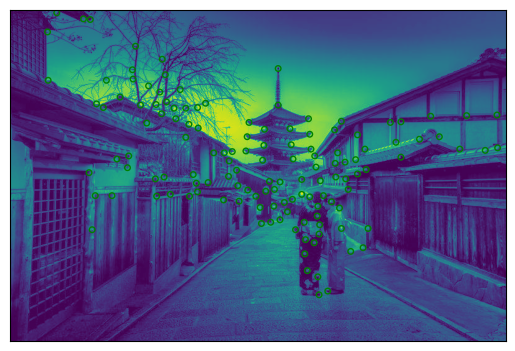

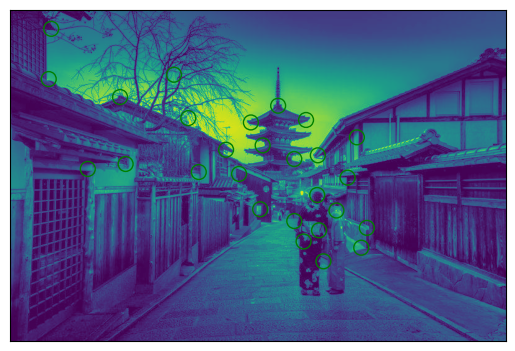

In [84]:
def corner(img, scale=2, dif=2.5, fth=2, k=0.1, th=0.03): #fth arg equals scale or scale level
    img_f = cv2.filter2D(img, -1, filters(scale)[0]) 
    grad = np.array(np.gradient(img_f))
    J1 = cv2.filter2D(grad[0] ** 2 , -1, filters(dif)[0]) 
    J2 = cv2.filter2D(grad[1] * grad[0] , -1, filters(dif)[0]) 
    J3 = cv2.filter2D(grad[1] ** 2 , -1, filters(dif)[0])
    
    root = np.sqrt((J1 - J3)**2 + 4 * (J2**2))
    lmax = 0.5 * (J1 + J3 + root)
    lmin = 0.5 * (J1 + J3 - root)

    R = lmin * lmax - k * ((lmax + lmin)**2)
    ns = np.ceil(3*scale)*2+1
    B_sq = utils.disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    n = np.logical_and(R > th * R.max(), Cond1)

    a = np.transpose(n.nonzero())
    a[:, [1, 0]]= a[:,[0, 1]]
    b = fth * np.ones((len(a), 1), dtype = int)
    return np.hstack((a, b))

utils.interest_points_visualization(kyoto, corner(kyoto, 1.5, 2.5, 1.5))
utils.interest_points_visualization(kyoto, corner(kyoto, 4, 4, 4))

    

Multi-Scaling

In [85]:
s = 1.5
N = 4
sigma = 2
r = 2.5

#Find all corners in N scales in an array: x_corn, y_corn, scale
corn = corner(kyoto, sigma, r, 0)
for i in range(1, N):
    corn = np.concatenate((corn, corner(kyoto, sigma * (s**i), r * (s ** i), i )), axis = 0) 

#Find all logs in N scale in an array logs: log(img) * N 
logs = np.array([sigma * (s**i) * np.abs(cv2.filter2D(kyoto, -1, filters(sigma * (s**i))[2])) for i in range(N)])
logs = np.moveaxis(logs, 0, -1)



In [86]:
ins = np.logical_and(corn[:,2]< (N-1), corn[:,2]>0) #corners in scale not first nor last 
first = corn[:,2] == 0 #corners in first scale
last = corn[:,2] == (N-1) #corners in last scale
y = corn[ins][:, 0]
x = corn[ins][:, 1]
z = corn[ins][:, 2]
y_f = corn[first][:, 0]
x_f = corn[first][:, 1]
z_f = corn[first][:, 2]
y_l = corn[last][:, 0]
x_l = corn[last][:, 1]
z_l = corn[last][:, 2]
Ins = np.logical_and(logs[x, y, z] > logs[x, y, z+1], logs[x, y, z] > logs[x, y, z-1]) #ins scale corners that maximize logs
First = logs[x_f, y_f, z_f] > logs[x_f, y_f, z_f+1] #first scale corners that maximize logs
Last = logs[x_l, y_l, z_l] > logs[x_l, y_l, z_l-1]#last scale corners that maximize logs

In [87]:
corners = np.concatenate((corn[first][First], corn[ins][Ins]), axis=0)
corners = np.concatenate((corners, corn[last][Last]), axis=0)

In [88]:
print(corners.shape, corn.shape)

(96, 3) (166, 3)


<AxesSubplot:>

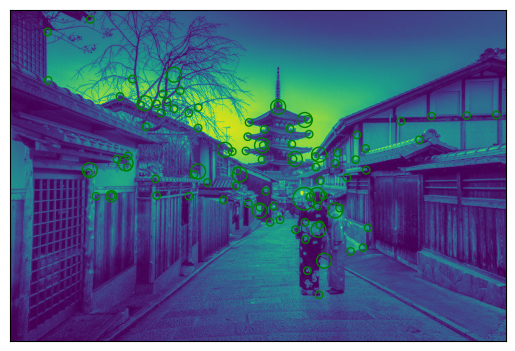

In [89]:
corners[:,2] = sigma * (s ** corners[:,2])
utils.interest_points_visualization(kyoto, corners)

<AxesSubplot:>

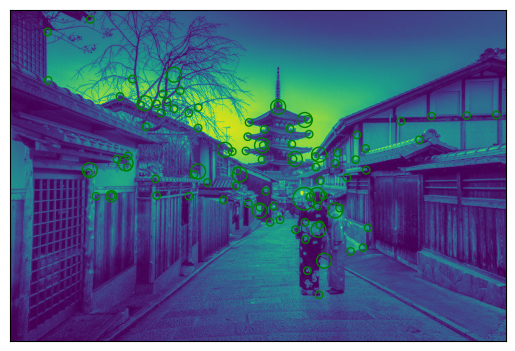

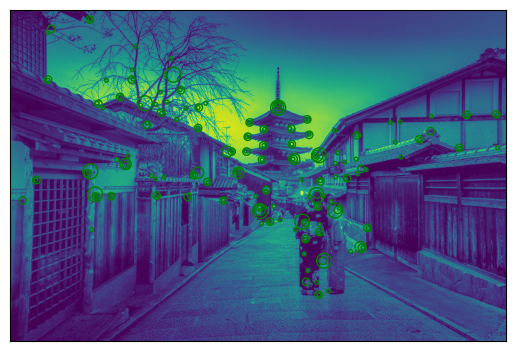

In [90]:
def multi_scaled_corn(img, sigma=2, s=1.5, N=4, r = 2.5):
    corn = corner(img, sigma, r, 0)
    for i in range(1, N):
        corn = np.concatenate((corn, corner(img, sigma * (s**i), r * (s ** i), i )), axis = 0)

    logs = np.array([sigma * (s**i) * np.abs(cv2.filter2D(img, -1, filters(sigma * (s**i))[2])) for i in range(N)])
    logs = np.moveaxis(logs, 0, -1)
    ins = np.logical_and(corn[:,2]< (N-1), corn[:,2]>0)
    first = corn[:,2] == 0
    last = corn[:,2] == (N-1)
    y = corn[ins][:, 0]
    x = corn[ins][:, 1]
    z = corn[ins][:, 2]
    y_f = corn[first][:, 0]
    x_f = corn[first][:, 1]
    z_f = corn[first][:, 2]
    y_l = corn[last][:, 0]
    x_l = corn[last][:, 1]
    z_l = corn[last][:, 2]
    Ins = np.logical_and(logs[x, y, z] > logs[x, y, z+1], logs[x, y, z] > logs[x, y, z-1])
    First = logs[x_f, y_f, z_f] > logs[x_f, y_f, z_f+1]
    Last = logs[x_l, y_l, z_l] > logs[x_l, y_l, z_l-1]
    corners = np.concatenate((corn[first][First], corn[ins][Ins]), axis=0)
    corners = np.concatenate((corners, corn[last][Last]), axis=0)
    corners[:,2] = sigma * (s ** corners[:,2])
    return corners
utils.interest_points_visualization(kyoto, multi_scaled_corn(kyoto))
utils.interest_points_visualization(kyoto, multi_scaled_corn(kyoto, sigma = 1.4, s=1.2, N=7))

BLOB DETECTION

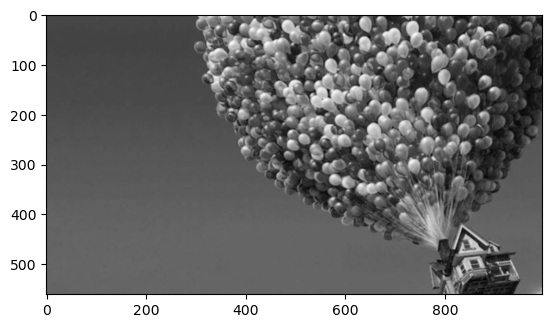

In [91]:
up = cv2.imread('up.png', cv2.IMREAD_GRAYSCALE)

up = up.astype(float)/255
# Show image
plt.imshow(up, cmap='gray')

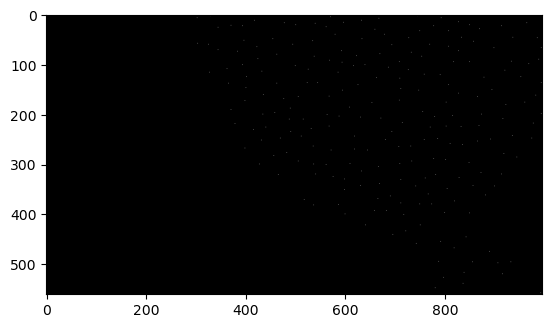

In [92]:
sigma_b = 3
r_b = 2
img_f = cv2.filter2D(up, -1, filters(sigma_b)[0]) 
grad = np.array(np.gradient(img_f))
grad_xx, grad_xy = np.array(np.gradient(grad[0,:]))
grad_yx, grad_yy = np.array(np.gradient(grad[1,:]))

H_det = grad_xx * grad_yy - (grad_xy ** 2)
ns = np.ceil(3*sigma_b)*2+1
B_sq = utils.disk_strel(ns)
Cond1 = ( H_det==cv2.dilate(H_det,B_sq) )
plt.figure()
n_b = np.logical_and(H_det > 0.001 * H_det.max(), Cond1)
plt.imshow(n_b, cmap = 'gray')



<AxesSubplot:>

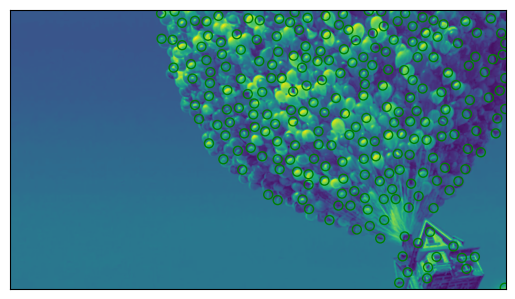

In [93]:
a = np.transpose(n_b.nonzero())
a[:, [1, 0]]= a[:,[0, 1]]
b = sigma_b * np.ones((len(a), 1))
b = np.hstack((a, b))
utils.interest_points_visualization(up, b)

<AxesSubplot:>

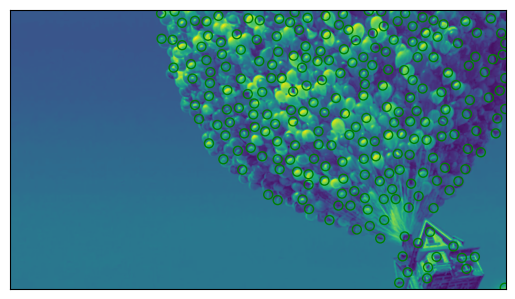

In [94]:
def get_blobs(img, scale=3, fth=3, k=0.001):
    img_f = cv2.filter2D(img, -1, filters(scale)[0]) 
    grad = np.array(np.gradient(img_f))
    grad_xx, grad_xy = np.array(np.gradient(grad[0,:]))
    grad_yx, grad_yy = np.array(np.gradient(grad[1,:]))

    H_det = grad_xx * grad_yy - (grad_xy ** 2)
    ns = np.ceil(3*scale)*2+1
    B_sq = utils.disk_strel(ns)
    Cond1 = ( H_det==cv2.dilate(H_det,B_sq) )
    n_b = np.logical_and(H_det > k * H_det.max(), Cond1)
    a = np.transpose(n_b.nonzero())
    a[:, [1, 0]]= a[:,[0, 1]]
    b = fth * np.ones((len(a), 1), dtype = int)
    b = np.hstack((a, b))
    return b
utils.interest_points_visualization(up, get_blobs(up))
    

MULTI-SCALING BLOBS

In [95]:
s = 1.5
N = 4
sigma = 2
r = 2.5
#corns = [corner(kyoto, sigma * (s**i), r * (s ** i) ) for i in range(N)]
blob = get_blobs(up, sigma, 0)
for i in range(1, N):
    blob = np.concatenate((blob, get_blobs(up, sigma * (s**i), i )), axis = 0) 

logs = np.array([sigma * (s**i) * np.abs(cv2.filter2D(up, -1, filters(sigma * (s**i))[2])) for i in range(N)])
logs = np.moveaxis(logs, 0, -1)

In [96]:
ins = np.logical_and(blob[:,2]< (N-1), blob[:,2]>0)
first = blob[:,2] == 0
last = blob[:,2] == (N-1)
y = blob[ins][:, 0]
x = blob[ins][:, 1]
z = blob[ins][:, 2]
y_f = blob[first][:, 0]
x_f = blob[first][:, 1]
z_f = blob[first][:, 2]
y_l = blob[last][:, 0]
x_l = blob[last][:, 1]
z_l = blob[last][:, 2]
Ins = np.logical_and(logs[x, y, z] > logs[x, y, z+1], logs[x, y, z] > logs[x, y, z-1])
First = logs[x_f, y_f, z_f] > logs[x_f, y_f, z_f+1]
Last = logs[x_l, y_l, z_l] > logs[x_l, y_l, z_l-1]


<AxesSubplot:>

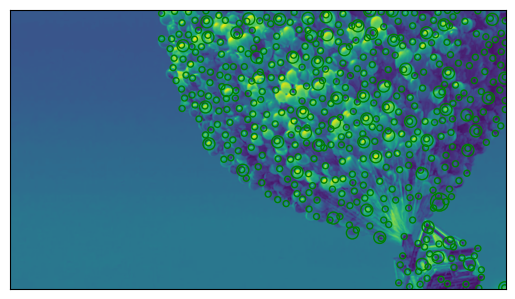

In [97]:
blobs = np.concatenate((blob[first][First], blob[ins][Ins]), axis=0)
blobs = np.concatenate((blobs, blob[last][Last]), axis=0)
blobs[:,2] = sigma * (s ** blobs[:,2])
utils.interest_points_visualization(up, blobs)


<AxesSubplot:>

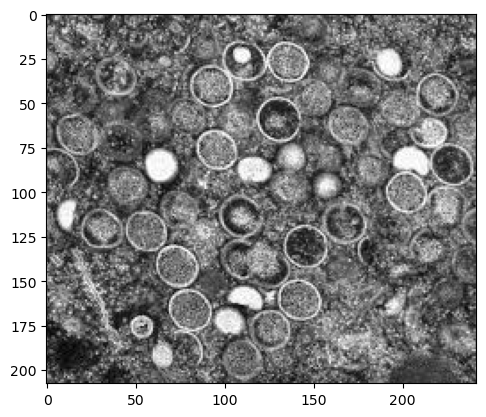

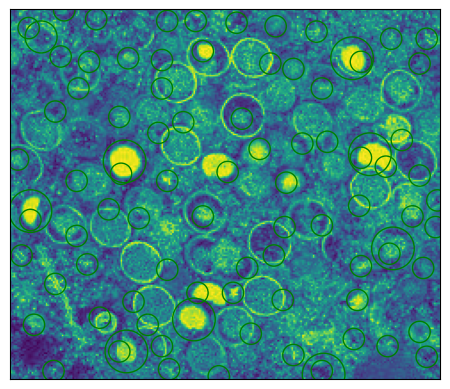

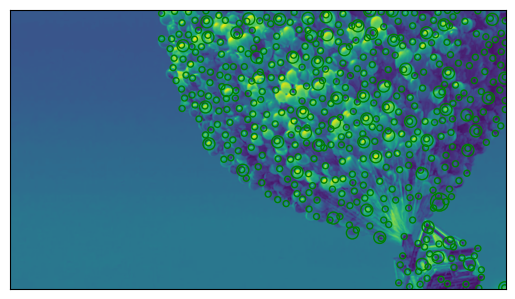

In [98]:
def multi_scaled_blobs(img, sigma=2, s=1.5, r=2.5, N=4):
    blob = get_blobs(img, sigma, 0)
    for i in range(1, N):
        blob = np.concatenate((blob, get_blobs(img, sigma * (s**i), i )), axis = 0) 

    logs = np.array([sigma * (s**i) * np.abs(cv2.filter2D(img, -1, filters(sigma * (s**i))[2])) for i in range(N)])
    logs = np.moveaxis(logs, 0, -1)
    ins = np.logical_and(blob[:,2]< (N-1), blob[:,2]>0)
    first = blob[:,2] == 0
    last = blob[:,2] == (N-1)
    y = blob[ins][:, 0]
    x = blob[ins][:, 1]
    z = blob[ins][:, 2]
    y_f = blob[first][:, 0]
    x_f = blob[first][:, 1]
    z_f = blob[first][:, 2]
    y_l = blob[last][:, 0]
    x_l = blob[last][:, 1]
    z_l = blob[last][:, 2]
    Ins = np.logical_and(logs[x, y, z] > logs[x, y, z+1], logs[x, y, z] > logs[x, y, z-1])
    First = logs[x_f, y_f, z_f] > logs[x_f, y_f, z_f+1]
    Last = logs[x_l, y_l, z_l] > logs[x_l, y_l, z_l-1]
    blobs = np.concatenate((blob[first][First], blob[ins][Ins]), axis=0)
    blobs = np.concatenate((blobs, blob[last][Last]), axis=0)
    blobs[:,2] = sigma * (s ** blobs[:,2])
    return blobs
cells = cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)

cells = cells.astype(float)/255
# Show image
plt.imshow(cells, cmap='gray')
utils.interest_points_visualization(cells, multi_scaled_blobs(cells))
utils.interest_points_visualization(up, multi_scaled_blobs(up))

        

BOX FILTERS

In [99]:
def integral_img(img):
    b = np.cumsum(img, axis=0)
    return np.cumsum(b, axis=1)



(73, 3)


<AxesSubplot:>

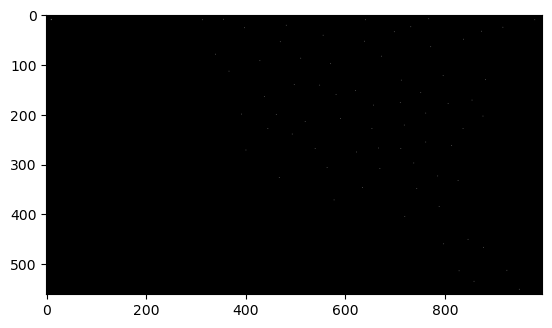

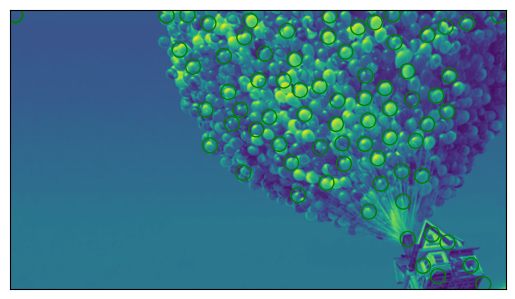

In [100]:
up = cv2.imread('up.png', cv2.IMREAD_GRAYSCALE)
up = up.astype(float)/255

sigma = 5
n = int(2*np.ceil(3*sigma)+1)
Dxx_h = Dyy_w = (4 * np.floor(n/6) + 1).astype(int)
Dxx_w = Dyy_h = Dxy_w = Dxy_h = (2 * np.floor(n/6) + 1).astype(int)
S = integral_img(up)
W, H = S.shape 
Par_x = np.pad(S, ((Dxx_h//2, 0), (Dxx_w//2, 0)), mode='edge')[:W, :H] - np.pad(S, ((Dxx_h//2, 0), (0, Dxx_w//2)), mode='edge')[:W, :H] \
         - np.pad(S, ((0, Dxx_h//2), (Dxx_w//2, 0)), mode='edge')[:W, :H] + np.pad(S, ((0, Dxx_h//2), (0, Dxx_w//2)), mode='edge')[:W, :H]
Par_y = np.pad(S, ((Dyy_h//2, 0), (Dyy_w//2, 0)), mode='edge')[:W, :H] - np.pad(S, ((Dyy_h//2, 0), (0, Dyy_w//2)), mode='edge')[:W, :H] \
         - np.pad(S, ((0, Dyy_h//2), (Dyy_w//2, 0)), mode='edge')[:W, :H] + np.pad(S, ((0, Dyy_h//2), (0, Dyy_w//2)), mode='edge')[:W, :H]
Par_xy = np.pad(S, ((Dxy_h//2, 0), (Dxy_w//2, 0)), mode='edge')[:W, :H] - np.pad(S, ((Dxy_h//2, 0), (0, Dxy_w//2)), mode='edge')[:W, :H] \
         - np.pad(S, ((0, Dxy_h//2), (Dxy_w//2, 0)), mode='edge')[:W, :H] + np.pad(S, ((0, Dxy_h//2), (0, Dxy_w//2)), mode='edge')[:W, :H]

Lxx = -2 * Par_x + np.pad(Par_x, ((0, 0), (Dxx_w, 0)), mode='edge')[:W, :H] + np.pad(Par_x, ((0, 0), (0, Dxx_w)), mode='edge')[:W, :H]
Lyy = -2 * Par_y + np.pad(Par_y, ((Dyy_h, 0), (0, 0)), mode='edge')[:W, :H] + np.pad(Par_y, ((0, Dyy_h), (0, 0)), mode='edge')[:W, :H]
Lxy = np.pad(Par_xy, ((Dxy_h//2, 0), (Dxy_w//2, 0)), mode='edge')[:W, :H] - np.pad(Par_xy, ((Dxy_h//2, 0), (0, Dxy_w//2)), mode='edge')[:W, :H] \
         - np.pad(Par_xy, ((0, Dxy_h//2), (Dxy_w//2, 0)), mode='edge')[:W, :H] + np.pad(Par_xy, ((0, Dxy_h//2), (0, Dxy_w//2)), mode='edge')[:W, :H]


R = Lxx * Lyy - (0.9 * Lxy)**2

B_sq = utils.disk_strel(n)
Cond1 = ( R==cv2.dilate(R,B_sq) )
plt.figure()
n_c = np.logical_and(R > 0.1 * R.max(), Cond1)
plt.imshow(n_c, cmap = 'gray')
a = np.transpose(n_c.nonzero())
a[:, [1, 0]]= a[:,[0, 1]]
b = sigma * np.ones((len(a), 1), dtype = int)
b = np.hstack((a, b))
print(b.shape)
utils.interest_points_visualization(up, b)

<AxesSubplot:>

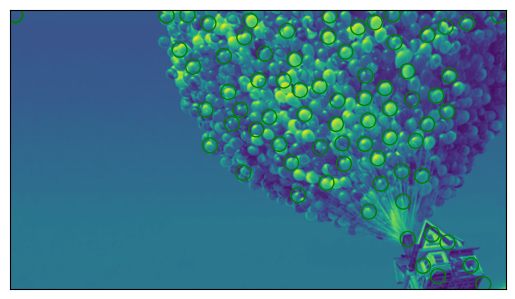

In [101]:
def box_fltrs_get_blobs(img=up, scale=2, fth=2, k=0.01):
    n = int(2*np.ceil(3*scale)+1)
    Dxx_h = Dyy_w = (4 * np.floor(n/6) + 1).astype(int)
    Dxx_w = Dyy_h = Dxy_w = Dxy_h = (2 * np.floor(n/6) + 1).astype(int)
    S = integral_img(img)
    W, H = S.shape 
    Par_x = np.pad(S, ((Dxx_h//2, 0), (Dxx_w//2, 0)), mode='edge')[:W, :H] - np.pad(S, ((Dxx_h//2, 0), (0, Dxx_w//2)), mode='edge')[:W, :H] \
            - np.pad(S, ((0, Dxx_h//2), (Dxx_w//2, 0)), mode='edge')[:W, :H] + np.pad(S, ((0, Dxx_h//2), (0, Dxx_w//2)), mode='edge')[:W, :H]
    Par_y = np.pad(S, ((Dyy_h//2, 0), (Dyy_w//2, 0)), mode='edge')[:W, :H] - np.pad(S, ((Dyy_h//2, 0), (0, Dyy_w//2)), mode='edge')[:W, :H] \
            - np.pad(S, ((0, Dyy_h//2), (Dyy_w//2, 0)), mode='edge')[:W, :H] + np.pad(S, ((0, Dyy_h//2), (0, Dyy_w//2)), mode='edge')[:W, :H]
    Par_xy = np.pad(S, ((Dxy_h//2, 0), (Dxy_w//2, 0)), mode='edge')[:W, :H] - np.pad(S, ((Dxy_h//2, 0), (0, Dxy_w//2)), mode='edge')[:W, :H] \
            - np.pad(S, ((0, Dxy_h//2), (Dxy_w//2, 0)), mode='edge')[:W, :H] + np.pad(S, ((0, Dxy_h//2), (0, Dxy_w//2)), mode='edge')[:W, :H]

    Lxx = -2 * Par_x + np.pad(Par_x, ((0, 0), (Dxx_w, 0)), mode='edge')[:W, :H] + np.pad(Par_x, ((0, 0), (0, Dxx_w)), mode='edge')[:W, :H]
    Lyy = -2 * Par_y + np.pad(Par_y, ((Dyy_h, 0), (0, 0)), mode='edge')[:W, :H] + np.pad(Par_y, ((0, Dyy_h), (0, 0)), mode='edge')[:W, :H]
    Lxy = np.pad(Par_xy, ((Dxy_h//2, 0), (Dxy_w//2, 0)), mode='edge')[:W, :H] - np.pad(Par_xy, ((Dxy_h//2, 0), (0, Dxy_w//2)), mode='edge')[:W, :H] \
            - np.pad(Par_xy, ((0, Dxy_h//2), (Dxy_w//2, 0)), mode='edge')[:W, :H] + np.pad(Par_xy, ((0, Dxy_h//2), (0, Dxy_w//2)), mode='edge')[:W, :H]


    R = Lxx * Lyy - (0.9 * Lxy)**2

    B_sq = utils.disk_strel(n)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    n_c = np.logical_and(R > k * R.max(), Cond1)
    a = np.transpose(n_c.nonzero())
    a[:, [1, 0]]= a[:,[0, 1]]
    b = fth * np.ones((len(a), 1), dtype = int)
    return np.hstack((a, b))

utils.interest_points_visualization(up, box_fltrs_get_blobs(up, 5, 5, 0.1))


Multi-Scaling with Box Filters

<AxesSubplot:>

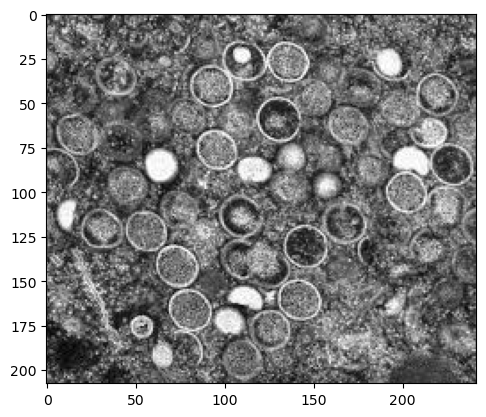

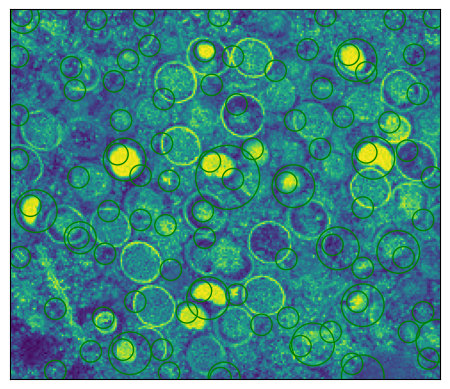

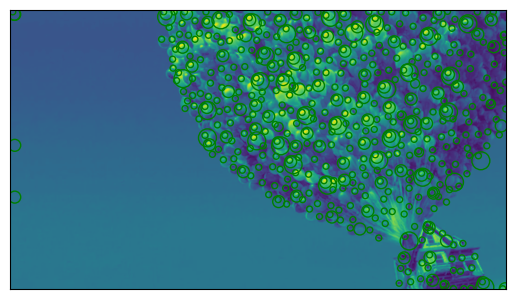

In [102]:
def box_fltrs_multi_scaled_blobs(img, sigma=2, s=1.5, r=2.5, N=4):
    blob = box_fltrs_get_blobs(img, sigma, 0)
    for i in range(1, N):
        blob = np.concatenate((blob, box_fltrs_get_blobs(img, sigma * (s**i), i )), axis = 0) 

    logs = np.array([sigma * (s**i) * np.abs(cv2.filter2D(img, -1, filters(sigma * (s**i))[2])) for i in range(N)])
    logs = np.moveaxis(logs, 0, -1)
    ins = np.logical_and(blob[:,2]< (N-1), blob[:,2]>0)
    first = blob[:,2] == 0
    last = blob[:,2] == (N-1)
    y = blob[ins][:, 0]
    x = blob[ins][:, 1]
    z = blob[ins][:, 2]
    y_f = blob[first][:, 0]
    x_f = blob[first][:, 1]
    z_f = blob[first][:, 2]
    y_l = blob[last][:, 0]
    x_l = blob[last][:, 1]
    z_l = blob[last][:, 2]
    Ins = np.logical_and(logs[x, y, z] > logs[x, y, z+1], logs[x, y, z] > logs[x, y, z-1])
    First = logs[x_f, y_f, z_f] > logs[x_f, y_f, z_f+1]
    Last = logs[x_l, y_l, z_l] > logs[x_l, y_l, z_l-1]
    blobs = np.concatenate((blob[first][First], blob[ins][Ins]), axis=0)
    blobs = np.concatenate((blobs, blob[last][Last]), axis=0)
    blobs[:,2] = sigma * (s ** blobs[:,2])
    return blobs
cells = cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)

cells = cells.astype(float)/255
# Show image
plt.imshow(cells, cmap='gray')
utils.interest_points_visualization(cells, box_fltrs_multi_scaled_blobs(cells))
utils.interest_points_visualization(up, box_fltrs_multi_scaled_blobs(up))

        

# Μέρος 3ο

Matching evaluation for detectors, decriptors combinations

In [115]:
%%time
# You can use either of the following lines to extract features (HOG/SURF).
desc_fun_S = lambda I, kp: utils3.featuresSURF(I,kp)
desc_fun_H = lambda I, kp: utils3.featuresHOG(I,kp)

# Execute evaluation by providing the above functions as arguments
# Returns 2 1x3 arrays containing the errors
#get one scaled corners
detect_fun = lambda I: corner(I, 1.5, 2.5)
avg_scale_errors_S, avg_theta_errors_S = utils3.matching_evaluation(detect_fun, desc_fun_S)
avg_scale_errors_H, avg_theta_errors_H = utils3.matching_evaluation(detect_fun, desc_fun_H)
print('\033[1m' + 'One scaled Corners' + '\033[0m')
print('Image 1:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[0]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[0]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[0]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[0]))
print('Image 2:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[1]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[1]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[1]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[1]))
print('Image 3:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[2]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[2]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[2]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[2]))

%time
#get multi scaled corners
detect_fun = lambda I: multi_scaled_corn(I, 1.4, 1.2, 7)
avg_scale_errors_S, avg_theta_errors_S = utils3.matching_evaluation(detect_fun, desc_fun_S)
avg_scale_errors_H, avg_theta_errors_H = utils3.matching_evaluation(detect_fun, desc_fun_H)
print('\n' + '\033[1m' + 'Multi scaled Corners' + '\033[0m')
print('Image 1:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[0]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[0]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[0]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[0]))
print('Image 2:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[1]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[1]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[1]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[1]))
print('Image 3:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[2]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[2]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[2]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[2]))

%time
#get one scaled blobs
detect_fun = lambda I: get_blobs(I, 2, 2, 0.05)
avg_scale_errors_S, avg_theta_errors_S = utils3.matching_evaluation(detect_fun, desc_fun_S)
avg_scale_errors_H, avg_theta_errors_H = utils3.matching_evaluation(detect_fun, desc_fun_H)
print('\n' + '\033[1m' + 'One scaled Blobs' + '\033[0m')
print('Image 1:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[0]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[0]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[0]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[0]))
print('Image 2:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[1]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[1]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[1]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[1]))
print('Image 3:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[2]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[2]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[2]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[2]))

%time
#get multi scaled blobs
detect_fun = lambda I: multi_scaled_blobs(I, 2, 1.2, 2.5, 7)
avg_scale_errors_S, avg_theta_errors_S = utils3.matching_evaluation(detect_fun, desc_fun_S)
avg_scale_errors_H, avg_theta_errors_H = utils3.matching_evaluation(detect_fun, desc_fun_H)
print('\n' + '\033[1m' + 'Multi scaled Blobs' + '\033[0m')
print('Image 1:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[0]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[0]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[0]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[0]))
print('Image 2:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[1]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[1]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[1]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[1]))
print('Image 3:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[2]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[2]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[2]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[2]))

%time
#get multi scaled blobs with box filters
detect_fun = lambda I: box_fltrs_multi_scaled_blobs(I, 2, 1.2, 2.5, 7)
avg_scale_errors_S, avg_theta_errors_S = utils3.matching_evaluation(detect_fun, desc_fun_S)
avg_scale_errors_H, avg_theta_errors_H = utils3.matching_evaluation(detect_fun, desc_fun_H)
print('\n' + '\033[1m' + 'Multi scaled Blobs with box filters' + '\033[0m')
print('Image 1:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[0]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[0]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[0]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[0]))
print('Image 2:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[1]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[1]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[1]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[1]))
print('Image 3:')
print('Avg. Scale Error for SURF: {:.3f}'.format(avg_scale_errors_S[2]))
print('Avg. Theta Error for SURF: {:.3f}'.format(avg_theta_errors_S[2]))
print('Avg. Scale Error for HOG: {:.3f}'.format(avg_scale_errors_H[2]))
print('Avg. Theta Error for HOG: {:.3f}'.format(avg_theta_errors_H[2]))

One scaled Corners
Image 1:
Avg. Scale Error for SURF: 0.003
Avg. Theta Error for SURF: 0.154
Avg. Scale Error for HOG: 0.144
Avg. Theta Error for HOG: 7.836
Image 2:
Avg. Scale Error for SURF: 0.011
Avg. Theta Error for SURF: 4.596
Avg. Scale Error for HOG: 0.351
Avg. Theta Error for HOG: 26.943
Image 3:
Avg. Scale Error for SURF: 0.005
Avg. Theta Error for SURF: 0.942
Avg. Scale Error for HOG: 0.145
Avg. Theta Error for HOG: 20.647
Wall time: 0 ns

Multi scaled Corners
Image 1:
Avg. Scale Error for SURF: 0.001
Avg. Theta Error for SURF: 0.140
Avg. Scale Error for HOG: 0.084
Avg. Theta Error for HOG: 24.305
Image 2:
Avg. Scale Error for SURF: 0.002
Avg. Theta Error for SURF: 0.093
Avg. Scale Error for HOG: 0.221
Avg. Theta Error for HOG: 27.564
Image 3:
Avg. Scale Error for SURF: 0.006
Avg. Theta Error for SURF: 0.224
Avg. Scale Error for HOG: 0.305
Avg. Theta Error for HOG: 23.586
Wall time: 0 ns

One scaled Blobs
Image 1:
Avg. Scale Error for SURF: 0.010
Avg. Theta Error for SURF: 4

In [107]:
HOG = lambda I, kp: utils3.featuresHOG(I,kp)
SURF = lambda I, kp: utils3.featuresSURF(I,kp)

features = []
features.append(utils3.FeatureExtraction(lambda I: multi_scaled_corn(I, 1.4, 1.2, 7), HOG))
features.append(utils3.FeatureExtraction(lambda I: multi_scaled_corn(I, 1.4, 1.2, 7), SURF))
features.append(utils3.FeatureExtraction(lambda I: multi_scaled_blobs(I, 2, 1.2, 2.5, 7), HOG))
features.append(utils3.FeatureExtraction(lambda I: multi_scaled_blobs(I, 2, 1.2, 2.5, 7), SURF))

Time for feature extraction: 661.592
Time for feature extraction: 609.424
Time for feature extraction: 937.977
Time for feature extraction: 777.179


In [108]:
names = ['Multi scaled corners with HOG', 'Multi scaled corners with SURF',
         'Multi scaled blobs with HOG', 'Multi scaled blobs with SURF']

for i in range(4):
    feats = features[i]
    accs = []
    for k in range(5):
        # Split into a training set and a test set.
        data_train, label_train, data_test, label_test = utils3.createTrainTest(feats, k)

        # Perform Kmeans to find centroids for clusters.
        BOF_tr, BOF_ts = utils3.BagOfWords(data_train, data_test)

        # Train an svm on the training set and make predictions on the test set
        acc, preds, probas = utils3.svm(BOF_tr, label_train, BOF_ts, label_test)
        accs.append(acc)

    print(names[i] + ' -> Mean accuracy: {:.3f}%'.format(100.0*np.mean(accs)))

Multi scaled corners with HOG -> Mean accuracy: 60.552%
Multi scaled corners with SURF -> Mean accuracy: 52.552%
Multi scaled blobs with HOG -> Mean accuracy: 65.517%
Multi scaled blobs with SURF -> Mean accuracy: 57.655%


feats list one channel for each class, one list for each image 64 valued decriptors for each interesting point in image

In [113]:
from sklearn.cluster import KMeans

def BagOfWords(data_train, data_test):
    k = data_train[0]
    for i in data_train[1:]:
        k = np.concatenate((k, i), axis=0)
    sampled_k = k[np.random.choice(len(k), len(k)//2)]
    #print(len(k), len(sampled_k))
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=700, random_state=0).fit(sampled_k)
    centers = kmeans.cluster_centers_
    l =  np.histogram(kmeans.predict(data_train[0]), 699, (0, 699))[0]
    Sum = sum([i**2 for i in l])
    BoW_tr = l / Sum
    for i in data_train[1:]:
        l =  np.histogram(kmeans.predict(i), 699, (0, 699))[0]
        Sum = sum([i**2 for i in l])
        BoW_tr = np.vstack((BoW_tr, l / Sum))

    l =  np.histogram(kmeans.predict(data_test[0]), 699, (0, 699))[0]
    Sum = sum([i**2 for i in l])
    BoW_test = l / Sum
    for i in data_test[1:]:
        l =  np.histogram(kmeans.predict(i), 699, (0, 699))[0]
        Sum = sum([i**2 for i in l])
        BoW_test = np.vstack((BoW_test, l / Sum))
    return BoW_tr, BoW_test

In [114]:
for i in range(4):
    feats = features[i]
    accs = []
    for k in range(5):
        # Split into a training set and a test set.
        data_train, label_train, data_test, label_test = utils3.createTrainTest(feats, k)

        # Perform Kmeans to find centroids for clusters.
        BOF_tr, BOF_ts = BagOfWords(data_train, data_test)

        # Train an svm on the training set and make predictions on the test set
        acc, preds, probas = utils3.svm(BOF_tr, label_train, BOF_ts, label_test)
        accs.append(acc)

    print(names[i] + ' -> Mean accuracy: {:.3f}%'.format(100.0*np.mean(accs)))

Multi scaled corners with HOG -> Mean accuracy: 59.862%
Multi scaled corners with SURF -> Mean accuracy: 51.586%
Multi scaled blobs with HOG -> Mean accuracy: 65.241%
Multi scaled blobs with SURF -> Mean accuracy: 57.655%
